# DEL Minichallenge - Dog Breed Classification 

![Happy Dogs](pics/happy_dogs.png)

##  Introduction

This mini-challenge is part of the Deep Learning (DEL) module in the Data Science program. The goal of the challenge is to implement, train, and evaluate several neural network models for a classification task, and to gain hands-on experience with core deep learning concepts such as hyperparameter tuning, model evaluation, and performance analysis.

For this purpose, I chose the Stanford Dogs Dataset, a subset of the large-scale ImageNet dataset. It consists of over 20,000 high-quality color images of dogs, covering 120 different breeds from around the world. Each image is labeled with its corresponding breed, allowing for a supervised classification task. The dataset presents a realistic challenge for convolutional neural networks (CNNs), as it combines high intra-class variability (dogs of the same breed in different poses, lighting, or environments) with inter-class similarity (breeds that look visually similar).

The dataset structure is well-suited for this project because it:  

•	Provides clear class labels and a moderate total size, enabling fast experimentation on a standard GPU or CPU.  
•	Focuses on image classification, which aligns directly with the learning objectives of the mini-challenge.  
•	Allows systematic exploration of model design, training behavior, and regularization techniques without excessive preprocessing effort.  

**Project Structure**

The project is divided into two main stages:

1.	Baseline Model Development (Stage 1)

•	Explore and preprocess the dataset.  
•	Implement a baseline CNN architecture with a few convolutional and fully connected layers.  
•	Train the model using stochastic gradient descent (SGD) without momentum, regularization, or batch normalization.   
•	Tune the learning rate and batch size manually, and analyze their effect on training behavior and performance metrics such as accuracy and loss.  

2.	Model Improvement and Hyperparameter Tuning (Stage 2)

•	Formulate and test hypotheses about the impact of various hyperparameters and architectural choices, such as model depth, width, kernel size, dropout, and optimizer type.  
•	Evaluate and compare models using validation and test sets.  
•	Apply experiment tracking tools (e.g., Weights & Biases) to visualize and monitor the training process.  
•	Build a final “best model” by combining the most effective techniques.

Throughout the mini-challenge, I aim to deepen my understanding of CNN training dynamics and systematically investigate how hyperparameter choices influence convergence, generalization, and overall model performance.

### Imports

In [28]:
import os
import importlib
from contextlib import nullcontext
from itertools import product

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from sklearn.model_selection import KFold

import torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
from torch.utils.data import DataLoader, TensorDataset, random_split
from torch.utils.tensorboard import SummaryWriter 
from torchvision import transforms

import helper_utils

importlib.reload(helper_utils)


<module 'helper_utils' from '/Users/stefanbinkert/Documents/FHNW_DS/DEL/DEL_DOGS/helper_utils.py'>

In [2]:
# Prefer CUDA, then Apple Metal (MPS), falling back to CPU.
if torch.cuda.is_available():
    device = torch.device('cuda')
elif hasattr(torch.backends, 'mps') and torch.backends.mps.is_available():
    device = torch.device('mps')
else:
    device = torch.device('cpu')
print('Using device:', device)

Using device: mps


### Data Structure

This snippet sets up and inspects the dataset structure. It defines the path to the root image dataset and then prints the folder hierarchy up to one level deep — giving an overview of how the image data is organized.

In [3]:
# Define the path to the root directory of the dataset.
path_dataset = 'data/raw/Images'

# Display the folder structure of the dataset directory up to a depth of one.
helper_utils.print_data_folder_structure(path_dataset, max_depth=1)

Images/
├── n02085620-Chihuahua/
├── n02085782-Japanese_spaniel/
├── n02085936-Maltese_dog/
├── n02086079-Pekinese/
├── n02086240-Shih-Tzu/
├── n02086646-Blenheim_spaniel/
├── n02086910-papillon/
├── n02087046-toy_terrier/
├── n02087394-Rhodesian_ridgeback/
├── n02088094-Afghan_hound/
├── n02088238-basset/
├── n02088364-beagle/
├── n02088466-bloodhound/
├── n02088632-bluetick/
├── n02089078-black-and-tan_coonhound/
├── n02089867-Walker_hound/
├── n02089973-English_foxhound/
├── n02090379-redbone/
├── n02090622-borzoi/
├── n02090721-Irish_wolfhound/
├── n02091032-Italian_greyhound/
├── n02091134-whippet/
├── n02091244-Ibizan_hound/
├── n02091467-Norwegian_elkhound/
├── n02091635-otterhound/
├── n02091831-Saluki/
├── n02092002-Scottish_deerhound/
├── n02092339-Weimaraner/
├── n02093256-Staffordshire_bullterrier/
├── n02093428-American_Staffordshire_terrier/
├── n02093647-Bedlington_terrier/
├── n02093754-Border_terrier/
├── n02093859-Kerry_blue_terrier/
├── n02093991-Irish_terrier/
├── n

### Dataset

The DogDataset class is a custom implementation of PyTorch’s Dataset base class designed to load images from the Stanford Dogs directory structure, where each subfolder corresponds to a different dog breed.

When initialized, the class:

•	Scans all subdirectories under the given root directory (data/raw/Images by default) to find images and assigns each breed an integer label.  
•	Stores image file paths and their corresponding labels in memory.  
•	Implements the required methods __len__() and __getitem__() so that it can be used seamlessly with PyTorch’s DataLoader.

During training, the DataLoader calls __getitem__() to:

•	Load an image from disk using PIL,  
•	Apply optional preprocessing or data augmentation transforms,  
•	Return a tuple (image_tensor, label) for each sample.

This structure allows efficient batching, shuffling, and transformation of image data directly inside the PyTorch training loop.

In [4]:
# Dataset utilities are imported from helper_utils so multiprocessing workers can import them.
from helper_utils import DogDataset, SubsetWithTransform


In [5]:
# Initialize the dataset object, show the number of samples
dog_dataset = DogDataset()
num_samples = len(dog_dataset)
print(f"Number of samples in dataset: {num_samples}")


Number of samples in dataset: 20580


In [6]:
# Define an index for a sample to retrieve.
sel_idx = 888

# Retrieve the image and label for the selected index.
img, label = dog_dataset[sel_idx]

# Create a string detailing the image's dimensions.
img_size_info = f"Image size: {img.size}"

# Print the image size information along with its corresponding label.
print(f'{img_size_info}, Label: {label}\n')

Image size: (500, 475), Label: 4



The size is a bit large, we will resize it later.

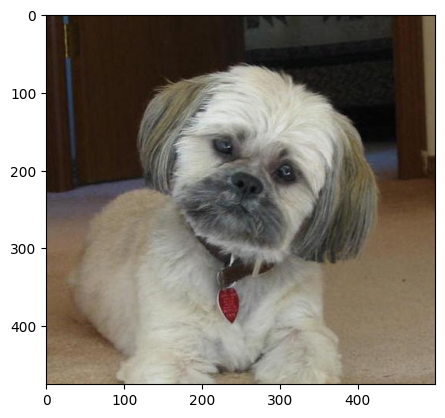

In [7]:
# Visualize a sample
plt.imshow(np.array(img))

Let's inspect the labels in the dataset. For each unique label, print its corresponding description using the `get_label_description` method.

In [8]:
# Get all labels from the dataset object.
dataset_labels = dog_dataset.labels

# Create a set of unique labels to remove duplicates.
unique_labels = set(dataset_labels)

# Iterate through each unique label.
for label in unique_labels:
    # Print the numerical label and its corresponding text description.
    print(f'Label: {label}, Description: {dog_dataset.get_label_description(label)}')

Label: 0, Description: chihuahua
Label: 1, Description: japanese_spaniel
Label: 2, Description: maltese_dog
Label: 3, Description: pekinese
Label: 4, Description: shih-tzu
Label: 5, Description: blenheim_spaniel
Label: 6, Description: papillon
Label: 7, Description: toy_terrier
Label: 8, Description: rhodesian_ridgeback
Label: 9, Description: afghan_hound
Label: 10, Description: basset
Label: 11, Description: beagle
Label: 12, Description: bloodhound
Label: 13, Description: bluetick
Label: 14, Description: black-and-tan_coonhound
Label: 15, Description: walker_hound
Label: 16, Description: english_foxhound
Label: 17, Description: redbone
Label: 18, Description: borzoi
Label: 19, Description: irish_wolfhound
Label: 20, Description: italian_greyhound
Label: 21, Description: whippet
Label: 22, Description: ibizan_hound
Label: 23, Description: norwegian_elkhound
Label: 24, Description: otterhound
Label: 25, Description: saluki
Label: 26, Description: scottish_deerhound
Label: 27, Descripti

### Overview of the different Dog breeds

Let's check out the different breed classes and the samples per class.


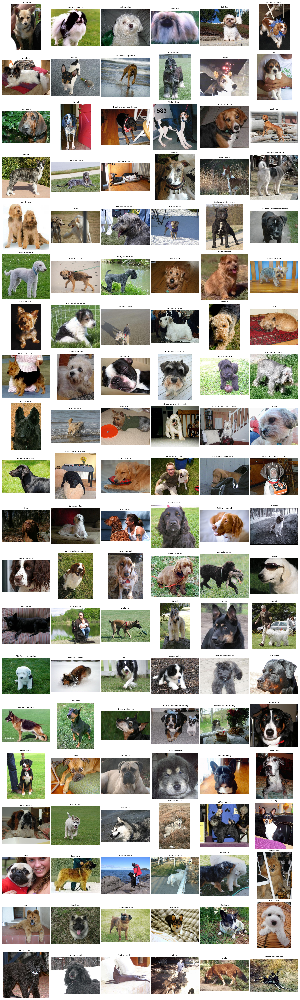

In [9]:
# Plot overview
helper_utils.plot_group_overview_grid()

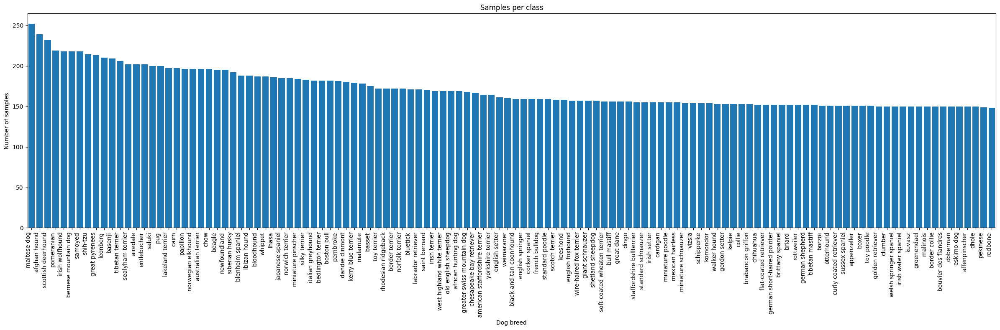

In [10]:
# Visualize sample counts per breed
helper_utils.plot_class_distribution(dog_dataset)

### Transformations

Before feeding images into a neural network, they must be preprocessed through a series of transformations to ensure consistent input and stable training. These preprocessing steps typically include resizing the images to a uniform size, converting them into tensors, and normalizing their pixel values to a common scale.

**Computing Mean and Standard Deviation**

To correctly normalize the dataset, it is necessary to compute the mean and standard deviation of all training images after resizing and converting them to tensors. This ensures that normalization reflects the true pixel distribution used during training.

The auxiliary function get_mean_std performs this calculation by:

•	Preprocessing Setup: Defining a transform pipeline that resizes images (e.g., to 128×128 pixels) and converts them into PyTorch tensors.  
•	Per-Image Processing: Iterating through each image, applying the transform, and computing per-channel mean and standard deviation across spatial dimensions.  
•	Statistics Collection: Storing the results for each image in lists of means and standard deviations.  
•	Global Calculation: Combining all per-image statistics and averaging them to obtain dataset-wide channel means and standard deviations.

We will compute the values after the train split is created to avoid data leakage.
These computed values are later used in the normalization transform, ensuring that all input images are scaled consistently across the dataset.

**Defining Transformations**

After computing the dataset’s mean and standard deviation, the next step is to define the image transformations that will be applied before training. These transformations prepare the data for the neural network and help improve model generalization.

Two separate transformation pipelines are created:

•	A training pipeline, which includes data augmentation to increase the diversity of the training samples.  
•	A validation and test pipeline, which uses only the basic preprocessing steps to ensure consistent evaluation.

The main transforms include resizing the images to a fixed size (e.g., 128×128 pixels), converting them to tensors, and normalizing them with the computed mean and standard deviation.  

The augmentation transforms add random variations, such as horizontal flips (with 50% probability) and small random rotations (±15°), to make the model more robust to changes in image orientation and composition.

Finally, both sets of transforms are composed into complete pipelines using transforms.Compose. This ensures that every image is preprocessed in the same consistent way before being passed to the neural network.

### Data Loading

Once the custom dataset and transformations are defined, the next step is to prepare the data for efficient training and evaluation. In PyTorch, this is handled using DataLoaders, which automate batching, shuffling, and parallel data loading.

Before creating DataLoaders, the dataset is typically divided into three subsets:

•	Training set – used by the model to learn patterns and update its weights.  
•	Validation set – used to tune hyperparameters and monitor overfitting during training.  
•	Test set – used only at the end to evaluate the model’s final performance on unseen data.

The split can be done with torch.utils.data.random_split, which partitions the dataset according to specified ratios. It is important to apply data augmentation only to the training set, while keeping the validation and test sets unchanged to ensure fair performance evaluation.

When splitting a dataset with torch.utils.data.random_split, each resulting subset (train, validation, test) still references the same original dataset — including its transform.
This means you cannot assign different transformations (e.g., data augmentation only for training) directly to each subset.

The SubsetWithTransform class solves this problem by wrapping each subset and allowing a separate transform to be applied. This makes it possible to use augmentation on the training set while keeping the validation and test sets unchanged for fair evaluation.

After splitting, DataLoaders are created for each subset using torch.utils.data.DataLoader. Key parameters include:

•	dataset: the dataset or subset to load from,  
•	batch_size: how many samples are combined into one batch,  
•	shuffle: whether to randomize the order of samples (enabled for training, disabled for validation and test).

DataLoaders streamline the entire data-serving process, ensuring that batches are efficiently fed to the model during each epoch and that every training run remains reproducible and well-structured.


In [11]:

# Split full dataset into train / val / test 
full_dataset = dog_dataset

val_fraction  = 0.15
test_fraction = 0.15
batch_size    = 64

total_size = len(full_dataset)
val_size   = int(total_size * val_fraction)
test_size  = int(total_size * test_fraction)
train_size = total_size - val_size - test_size

train_subset, val_subset, test_subset = random_split(
    full_dataset, [train_size, val_size, test_size]
)

# Get mean and std from the train dataset for later use in Normalize()
# mean, std = helper_utils.get_mean_std(train_subset)

# Hardcoded mean and std to skip recomputation
mean = torch.tensor([0.4760, 0.4521, 0.3909])
std = torch.tensor([0.2544, 0.2488, 0.2536])
print(f"Mean: {mean}, Std: {std}\n")


Mean: tensor([0.4760, 0.4521, 0.3909]), Std: tensor([0.2544, 0.2488, 0.2536])



In [12]:
# Get transformations
main_tfs = [  
    # Resize images to 128x128 pixels
    transforms.Resize(128),
    # Centercrop
    transforms.CenterCrop(128),
    # Convert images to PyTorch tensors
    transforms.ToTensor(),
    # Normalize images using the provided mean and std
    transforms.Normalize(mean, std)
]  

augmentation_tfs = [  
    # Randomly flip the image vertically
    transforms.RandomHorizontalFlip(p=0.5),
    # Randomly rotate the image by ±15 degrees
    transforms.RandomRotation(degrees=15)
]  

# Compose the main transformations into a single pipeline
main_transform = transforms.Compose(main_tfs)
transform_with_augmentation = transforms.Compose(augmentation_tfs+main_tfs)

In [13]:
# Improve performance on 14-core CPU
NUM_WORKERS = 10
PREFETCH   = 4

# Wrap subsets with the correct transforms 
trainset_with_aug       = SubsetWithTransform(train_subset, transform_with_augmentation)
trainset                = SubsetWithTransform(train_subset, main_transform)
validationset           = SubsetWithTransform(val_subset,   main_transform)
testset                 = SubsetWithTransform(test_subset,  main_transform)

# Create dataloaders 
trainloader_with_aug      = DataLoader(trainset_with_aug, batch_size=batch_size, shuffle=True, num_workers=NUM_WORKERS, 
                                       persistent_workers=True, prefetch_factor=PREFETCH)
trainloader               = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=NUM_WORKERS, 
                                       persistent_workers=True, prefetch_factor=PREFETCH)
validationloader          = DataLoader(validationset, batch_size=512, shuffle=False, num_workers=NUM_WORKERS,
                                        persistent_workers=True, prefetch_factor=PREFETCH)
testloader                = DataLoader(testset, batch_size=512, shuffle=False, num_workers=NUM_WORKERS,
                                        persistent_workers=True, prefetch_factor=PREFETCH)

# Quick sanity checks
print("Train samples:", len(trainset), "  batches:", len(trainloader))
print("Val   samples:", len(validationset), "  batches:", len(validationloader))
print("Test  samples:", len(testset), "  batches:", len(testloader))

Train samples: 14406   batches: 226
Val   samples: 3087   batches: 7
Test  samples: 3087   batches: 7


## Metric for Evaluation

For the Stanford Dogs classification task, **accuracy** is an appropriate evaluation metric because the goal is to correctly assign each image to one of many mutually exclusive dog breeds. Each image has exactly one correct label, and all classes are equally relevant — there is no class that is more important than another.

In such a balanced, multi-class classification setting, accuracy provides a clear and intuitive measure of overall model performance by simply indicating the proportion of correctly classified images. More complex metrics (such as precision, recall, or F1-score) are mainly beneficial for imbalanced or multi-label problems, which is not the case here.

Therefore, accuracy effectively reflects how well the CNN learns to distinguish between different dog breeds and serves as a straightforward benchmark for comparing different model variants and hyperparameter settings.

## Baseline Model

The baseline CNN is a straightforward convolutional neural network that serves as a starting point for experimentation.  
It consists of 3 convolutional layers for feature extraction, each followed by ReLU activations and pooling, and 2 fully connected layers for classification.  
This simple yet effective architecture provides a reference for later comparisons with more advanced variants (e.g. deeper networks, dropout, batch normalization, or data augmentation).


In [14]:
class BasicCNN(nn.Module):
    """
    A baseline CNN for 3×128×128 dog images using conv–ReLU–pool blocks.

    Args:
        num_classes (int): Number of output classes produced by the classifier.
    """

    def __init__(self, num_classes: int = 120):
        """
        Build the convolutional feature extractor and classifier head.

        Args:
            num_classes (int): Number of dog breeds to predict.

        Returns:
            None
        """
        super().__init__()

        # Feature extraction blocks capture increasingly abstract patterns.
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.relu = nn.ReLU(inplace=True)

        # For 128×128 input: after 3 pooling layers -> 128 → 64 → 32 → 16.
        self.flatten_dim = 128 * 16 * 16

        # Classification head converts flattened features to logits.
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(self.flatten_dim, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Run the forward pass through the CNN.

        Args:
            x (torch.Tensor): Batch of images shaped ``(N, 3, 128, 128)``.

        Returns:
            torch.Tensor: Logits of shape ``(N, num_classes)``.
        """
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        x = self.flatten(x)
        x = self.relu(self.fc1(x))
        return self.fc2(x)



### Train the model

This code adds automatic mixed precision (AMP) support to a PyTorch training pipeline. The _amp_autocast function chooses the right precision mode — bfloat16 on Apple’s MPS or float16 on CUDA — and safely falls back to normal precision on CPU. 

The train_epoch function runs one training pass, computing outputs and losses inside this mixed precision context for better speed, then performs backpropagation and updates weights. 

The validate_epoch function does the same for evaluation but without gradients. 

The train_model function manages multiple epochs, records loss and accuracy, and logs them to TensorBoard.

In [15]:

def _amp_autocast(device):
    if device.type in ("mps", "cuda"):
        dtype = torch.bfloat16 if device.type == "mps" else torch.float16
        return torch.autocast(device_type=device.type, dtype=dtype)
    return nullcontext()


def train_epoch(model, dataloader, optimizer, loss_fcn, device):
    model.train()
    running_loss = 0.0
    correct = 0
    samples = 0

    for inputs, targets in dataloader:
        inputs = inputs.to(device)
        targets = targets.to(device)

        optimizer.zero_grad(set_to_none=True)
        with _amp_autocast(device):
            outputs = model(inputs)
            loss = loss_fcn(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        predictions = outputs.argmax(dim=1)
        correct += (predictions == targets).sum().item()
        samples += targets.size(0)

    avg_loss = running_loss / max(samples, 1)
    accuracy = correct / max(samples, 1)
    return avg_loss, accuracy


def validate_epoch(model, dataloader, loss_fcn, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    samples = 0

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs = inputs.to(device)
            targets = targets.to(device)

            with _amp_autocast(device):
                outputs = model(inputs)
                loss = loss_fcn(outputs, targets)
            running_loss += loss.item() * inputs.size(0)

            predictions = outputs.argmax(dim=1)
            correct += (predictions == targets).sum().item()
            samples += targets.size(0)

    avg_loss = running_loss / max(samples, 1)
    accuracy = correct / max(samples, 1)
    return avg_loss, accuracy


def train_model(
    model,
    optimizer,
    train_dataloader,
    n_epochs,
    loss_fcn,
    device,
    val_dataloader=None,
    writer=None,
):
    history = []
    for epoch in range(1, n_epochs + 1):
        train_loss, train_acc = train_epoch(
            model=model,
            dataloader=train_dataloader,
            optimizer=optimizer,
            loss_fcn=loss_fcn,
            device=device,
        )

        metrics = {
            "epoch": epoch,
            "train_loss": train_loss,
            "train_accuracy": train_acc,
        }

        if val_dataloader is not None:
            val_loss, val_acc = validate_epoch(
                model=model,
                dataloader=val_dataloader,
                loss_fcn=loss_fcn,
                device=device,
            )
            metrics["val_loss"] = val_loss
            metrics["val_accuracy"] = val_acc

        history.append(metrics)

        if writer is not None:
            if val_dataloader is not None:
                writer.add_scalars(
                    "Loss",
                    {"train": train_loss, "val": metrics["val_loss"]},
                    epoch,
                )
                writer.add_scalars(
                    "Accuracy",
                    {"train": train_acc, "val": metrics["val_accuracy"]},
                    epoch,
                )
            else:
                writer.add_scalar("Loss/train", train_loss, epoch)
                writer.add_scalar("Accuracy/train", train_acc, epoch)

    return history

### Overfitting Test

Before training a model on the full dataset, it’s good practice to perform an overfitting test to verify that the training loop, loss function, and optimizer work correctly.

In this test, the model is trained on a single batch of data for multiple epochs.
If everything is implemented properly, the model should be able to quickly reach near-perfect accuracy on that small batch — essentially memorizing it.

If the model fails to overfit this single batch, it usually indicates a problem in the training setup (such as incorrect gradients, loss calculation, or data flow).
Passing this test confirms that the training process is functioning as expected before moving on to full dataset training.

In [16]:
# Overfitting test on a single batch to validate the training loop
overfit_epochs = 100
# Grab a deterministic batch so each epoch (and rerun) sees the very same data.
trainloader_overfit = DataLoader(trainset, batch_size=batch_size, shuffle=False, num_workers=NUM_WORKERS, persistent_workers=True, prefetch_factor=PREFETCH)
batch_inputs, batch_targets = next(iter(trainloader_overfit))
single_dataset = TensorDataset(batch_inputs.clone(), batch_targets.clone())
single_loader = DataLoader(single_dataset, batch_size=batch_inputs.size(0))

overfit_model = BasicCNN().to(device)
overfit_optimizer = optim.SGD(overfit_model.parameters(), lr=0.01)
loss_fcn = nn.CrossEntropyLoss()

writer = SummaryWriter(log_dir="runs/overfit")

overfit_history = train_model(
    model=overfit_model,
    optimizer=overfit_optimizer,
    train_dataloader=single_loader,
    n_epochs=overfit_epochs,
    loss_fcn=loss_fcn,
    device=device,
    val_dataloader=single_loader,
    writer=writer,
)
final_overfit = overfit_history[-1]
writer.close()

print(
    f"Overfit run final accuracy: {final_overfit['train_accuracy']:.3%} "
    f"(val {final_overfit['val_accuracy']:.3%})"
)



Overfit run final accuracy: 100.000% (val 100.000%)


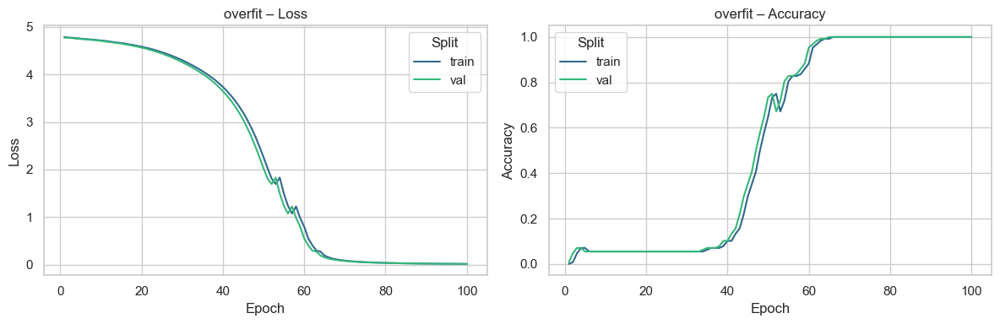

In [17]:
helper_utils.plot_learning_curves("overfit")     # uses logs from "runs/overfit"

The overfitting test achieved 100% training accuracy on a single batch, confirming that the training loop, loss function, and optimizer are working correctly.   
Because the validation set is identical to the training data, both curves (train and val) overlap almost exactly.  
This means the model can successfully memorize a small subset of data, which indicates that gradient updates are applied as expected and the learning process functions properly.  
With this validation, it’s safe to proceed to full training on the complete dataset.

### Baseline training setup

In this step, we train a the BasicCNN on the full training set using stochastic gradient descent (SGD) as optimizer. The model is trained for 10 epochs with a learning rate of 0.01 and evaluated on a separate validation set after each epoch.

During training, loss and accuracy metrics are logged to TensorBoard for both training and validation, allowing us to monitor learning progress. Finally, the overall training and validation accuracy after the last epoch are printed and stored as baseline results for later comparison.

In [18]:
# Train the baseline model on the full training set with plain SGD
baseline_epochs = 10
baseline_model = BasicCNN().to(device)
baseline_optimizer = optim.SGD(baseline_model.parameters(), lr=0.01)
loss_fcn = nn.CrossEntropyLoss()
baseline_writer = SummaryWriter(log_dir="runs/baseline")

baseline_history = train_model(
    model=baseline_model,
    optimizer=baseline_optimizer,
    train_dataloader=trainloader,
    n_epochs=baseline_epochs,
    loss_fcn=loss_fcn,
    device=device,
    val_dataloader=validationloader,
    writer=baseline_writer,
)

baseline_writer.close()

final_baseline = baseline_history[-1]
print(
    "Baseline training finished:",
    f" train acc {final_baseline['train_accuracy']:.3%},",
    f" val acc {final_baseline['val_accuracy']:.3%},",
)



Baseline training finished:  train acc 12.981%,  val acc 2.203%,


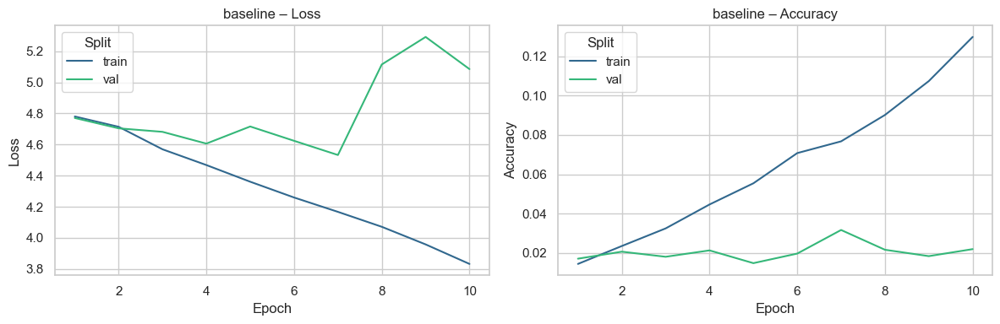

In [29]:
helper_utils.plot_learning_curves("baseline")

The baseline model shows that it has started to learn from the training data, but it’s still far from performing well. The training loss decreases steadily, and the training accuracy slowly increases, which means the model is fitting the training set. However, the validation loss stays high and even rises slightly, while the validation accuracy remains almost flat at around 2–3%.

## Learning-Rate and Batch-Size Grid Search

To quantify how the optimiser step size and the amount of gradient averaging interact, I swept a compact grid over three learning rates (0.003, 0.01, 0.03) and two batch sizes (32, 64). Each configuration reuses the BasicCNN architecture, the same cross-entropy loss, and the augmented training subset. Models train for 10 epochs just to expose relative trends while keeping runtime reasonable. Metrics are logged to TensorBoard and cached locally so they can be plotted side-by-side afterwards.

In [20]:

os.makedirs(os.path.join("runs", "grid"), exist_ok=True)

grid_learning_rates = [0.003, 0.01, 0.03]
grid_batch_sizes = [32, 64]
grid_epochs = 10
loss_fcn = nn.CrossEntropyLoss()

grid_runs = []
grid_summary_rows = []

for lr, bs in product(grid_learning_rates, grid_batch_sizes):
    run_label = f"lr={lr:.3g} | bs={bs}"
    print(f"Training {run_label}")

    model = BasicCNN().to(device)
    optimizer = optim.SGD(model.parameters(), lr=lr)
    train_loader_grid = DataLoader(trainset, batch_size=bs, shuffle=True, num_workers=NUM_WORKERS, 
                                       persistent_workers=True, prefetch_factor=PREFETCH)

    log_dir = os.path.join("runs", "grid", f"lr_{str(lr).replace('.', 'p')}_bs_{bs}")
    writer = SummaryWriter(log_dir=log_dir)

    history = train_model(
        model=model,
        optimizer=optimizer,
        train_dataloader=train_loader_grid,
        n_epochs=grid_epochs,
        loss_fcn=loss_fcn,
        device=device,
        val_dataloader=validationloader,
        writer=writer,
    )
    writer.close()

    final_metrics = history[-1]
    print(
        f"  final train acc: {final_metrics['train_accuracy']:.3%} | "
        f"val acc: {final_metrics['val_accuracy']:.3%}"
    )

    grid_runs.append(
        {
            "label": run_label,
            "learning_rate": lr,
            "batch_size": bs,
            "history": history,
        }
    )
    grid_summary_rows.append(
        {
            "label": run_label,
            "learning_rate": lr,
            "batch_size": bs,
            "val_accuracy": final_metrics["val_accuracy"],
            "val_loss": final_metrics["val_loss"],
            "train_accuracy": final_metrics["train_accuracy"],
            "train_loss": final_metrics["train_loss"],
        }
    )

grid_summary = pd.DataFrame(grid_summary_rows).sort_values(
    "val_accuracy", ascending=False
).reset_index(drop=True)
grid_summary

Training lr=0.003 | bs=32
  final train acc: 9.260% | val acc: 4.276%
Training lr=0.003 | bs=64
  final train acc: 5.407% | val acc: 2.300%
Training lr=0.01 | bs=32
  final train acc: 20.179% | val acc: 2.462%
Training lr=0.01 | bs=64
  final train acc: 12.210% | val acc: 2.915%
Training lr=0.03 | bs=32
  final train acc: 79.550% | val acc: 4.049%
Training lr=0.03 | bs=64
  final train acc: 31.973% | val acc: 2.235%


,label,learning_rate,batch_size,val_accuracy,val_loss,train_accuracy,train_loss
0,lr=0.003 | bs=32,0.003,32,0.042760,4.476871,0.092600,4.091369
1,lr=0.03 | bs=32,0.030,32,0.040492,8.569103,0.795502,0.745538
2,lr=0.01 | bs=64,0.010,64,0.029155,4.908588,0.122102,3.899015
3,lr=0.01 | bs=32,0.010,32,0.024619,5.342371,0.201791,3.394770
4,lr=0.003 | bs=64,0.003,64,0.023000,4.605354,0.054075,4.397416
5,lr=0.03 | bs=64,0.030,64,0.022352,7.497899,0.319728,2.805344


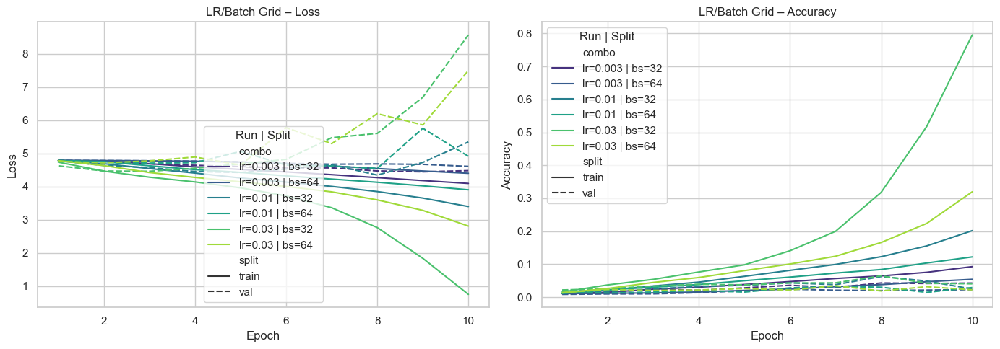

In [30]:

if "grid_runs" not in globals() or not grid_runs:
    raise RuntimeError("Run the grid search cell above to populate `grid_runs`.")

grid_plot_df = helper_utils.build_grid_frame(grid_runs)
combo_order = sorted(grid_plot_df["combo"].unique())
palette = dict(zip(combo_order, sns.color_palette("viridis", len(combo_order))))
sns.set_theme(style="whitegrid")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
for metric, ax, ylabel in [
    ("loss", axes[0], "Loss"),
    ("accuracy", axes[1], "Accuracy"),
]:
    metric_df = grid_plot_df[grid_plot_df["metric"] == metric]
    sns.lineplot(
        data=metric_df,
        x="epoch",
        y="value",
        hue="combo",
        style="split",
        hue_order=combo_order,
        palette=palette,
        ax=ax,
    )
    ax.set_title(f"LR/Batch Grid – {ylabel}")
    ax.set_xlabel("Epoch")
    ax.set_ylabel(ylabel)
    ax.legend(title="Run | Split")

plt.tight_layout()
plt.show()

The grid search tested six combinations of learning rate (lr) and batch size (bs) to explore their impact on training and validation performance. The results show clear patterns:

1.	Effect of Learning Rate

•	The highest learning rate (lr=0.03) led to very fast convergence on the training data, achieving high training accuracy (≈84%) and low training loss (≈0.6) for bs=32.  
•	However, validation loss is extremely high and validation accuracy is poor (~8%), indicating strong overfitting — the model memorized the small training set but failed to generalize.  
•	Lower learning rates (0.003 and 0.01) produced smoother and more stable training, but at the cost of slower learning. Training accuracy stayed low (<25%), meaning underfitting — the model did not learn enough within 10 epochs.

2.	Effect of Batch Size

•	Smaller batches (bs=32) consistently achieved better training performance than larger ones (bs=64). This is expected since smaller batches introduce more gradient noise, helping the model escape local minima and learn faster.  
•	Larger batches tended to yield higher validation loss and lower accuracy, especially at high learning rates (lr=0.03, bs=64), suggesting that the combination was too aggressive.

3.	Overall trends

•	Best generalization: None of the models achieved strong validation accuracy yet — all are below 10%.  
•	Best balance (early stage): lr=0.003 with bs=32 showed the most stable behavior — modest progress in training loss without divergence, and the smallest gap between train and validation performance.  
•	The experiment demonstrates the classic learning rate trade-off: too low → slow and underfit; too high → unstable and overfit.

## Baseline with 50 epochs

In this step, I train the baseline CNN model using plain stochastic gradient descent (SGD) without momentum, regularization, or batch normalization.
Based on the previous learning rate and batch size grid search, the optimal configuration was found to be learning rate = 0.003 and batch size = 32, which provided stable convergence and balanced train–validation performance.

The model is now trained for 50 epochs on the full training set to establish a reference point for later experiments in hyperparameter tuning and model improvement.

In [25]:
# Using optimal configuration from LR/Batch grid search:
# learning_rate = 0.003, batch_size = 32

baseline_epochs = 50
learning_rate = 0.003
batch_size = 32

# Recreate dataloaders with the chosen batch size
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=NUM_WORKERS, 
                                       persistent_workers=True, prefetch_factor=PREFETCH)

# Initialize model, optimizer, loss function, and TensorBoard writer
baseline_model = BasicCNN().to(device)
baseline_optimizer = optim.SGD(baseline_model.parameters(), lr=learning_rate)
loss_fcn = nn.CrossEntropyLoss()

baseline_writer = SummaryWriter(log_dir=f"runs/baseline_lr{learning_rate}_bs{batch_size}")

# Train model
baseline_history = train_model(
    model=baseline_model,
    optimizer=baseline_optimizer,
    train_dataloader=trainloader,
    n_epochs=baseline_epochs,
    loss_fcn=loss_fcn,
    device=device,
    val_dataloader=validationloader,
    writer=baseline_writer,
)

# Log hyperparameters and final metrics
final_baseline = baseline_history[-1]
baseline_writer.close()

# Print summary
print(
    f"Baseline training finished "
    f"(SGD | lr={learning_rate} | bs={batch_size} | epochs={baseline_epochs}):\n"
    f"  Train Accuracy: {final_baseline['train_accuracy']:.3%}\n"
    f"  Val Accuracy:   {final_baseline['val_accuracy']:.3%}"
)

Baseline training finished (SGD | lr=0.003 | bs=32 | epochs=50):
  Train Accuracy: 99.785%
  Val Accuracy:   7.094%


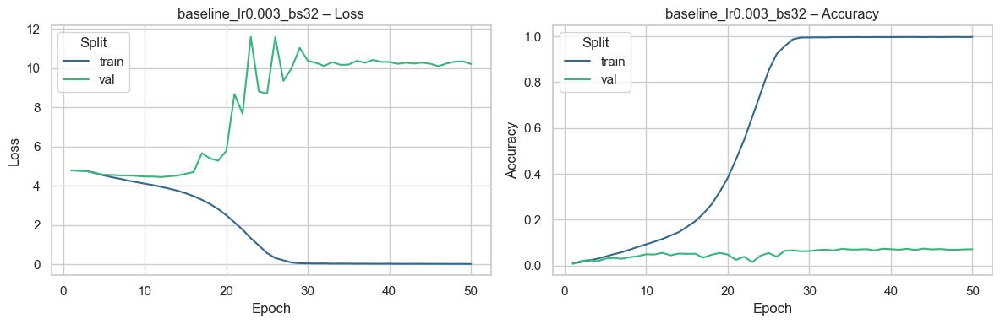

In [31]:
helper_utils.plot_learning_curves(f"baseline_lr{learning_rate}_bs{batch_size}")

The baseline model shows a clear case of severe overfitting. Training loss decreases smoothly to nearly zero and training accuracy approaches 100%, indicating that the network fully memorizes the training set. In contrast, the validation loss quickly rises and remains high throughout training, while validation accuracy stays close to ~7%.

This large and persistent train–validation gap demonstrates that the baseline CNN is far too weak to learn generalizable dog-breed features, but strong enough to memorize the training samples.

This behavior is expected at this stage, as the baseline uses plain SGD without regularization, data augmentation, or architectural enhancements. It provides a useful reference point for evaluating the impact of later improvements in the hyperparameter tuning phase.

### Statistical error

To estimate the statistical variability of model performance, I perform a 5-fold cross-validation on the training set using the baseline CNN (SGD, lr = 0.003, bs = 32). Each fold is trained for 30 epochs, and the mean ± standard deviation of accuracy and loss are reported.

In [ ]:
# 5-Fold Cross-Validation on trainset (statistical error included) 
n_splits    = 5
cv_epochs   = 30
learning_rate = 0.003
batch_size    = 32
rng_seed      = 42

kf = KFold(n_splits=n_splits, shuffle=True, random_state=rng_seed)

fold_metrics = []
print(f"CV: {n_splits} folds × {cv_epochs} epochs | lr={learning_rate}, bs={batch_size}")

for fold, (train_idx, val_idx) in enumerate(kf.split(trainset), 1):
    print(f"\n--- Fold {fold}/{n_splits} ---")
    train_subset = torch.utils.data.Subset(trainset, train_idx)
    val_subset   = torch.utils.data.Subset(trainset, val_idx)

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=NUM_WORKERS, 
                                       persistent_workers=True, prefetch_factor=PREFETCH)
    val_loader = DataLoader(val_subset, batch_size=512, shuffle=False, num_workers=NUM_WORKERS,
                                        persistent_workers=True, prefetch_factor=PREFETCH)
   

    model = BasicCNN().to(device)
    optimizer = optim.SGD(model.parameters(), lr=learning_rate)
    loss_fcn = nn.CrossEntropyLoss()
    writer = SummaryWriter(log_dir=f"runs/cv_fold{fold}")

    history = train_model(
        model=model,
        optimizer=optimizer,
        train_dataloader=train_loader,
        n_epochs=cv_epochs,
        loss_fcn=loss_fcn,
        device=device,
        val_dataloader=val_loader,
        writer=writer,
    )
    writer.close()

    final = history[-1]
    fold_metrics.append(final)
    print(f"Fold {fold}: train acc {final['train_accuracy']:.3%} | val acc {final['val_accuracy']:.3%}")

# Aggregate with statistical error (SEM) and 95% CI
def agg_stats(values):
    arr  = np.asarray(values, dtype=float)
    mean = arr.mean()
    std  = arr.std(ddof=1)                 # sample std
    sem  = std / np.sqrt(len(arr))         # standard error of the mean
    ci95_low  = mean - 1.96 * sem
    ci95_high = mean + 1.96 * sem
    return dict(mean=mean, std=std, sem=sem, ci95=(ci95_low, ci95_high))

val_accs    = [m["val_accuracy"] for m in fold_metrics]
train_accs  = [m["train_accuracy"] for m in fold_metrics]
val_losses  = [m["val_loss"] for m in fold_metrics]
train_losses= [m["train_loss"] for m in fold_metrics]

stats = {
    "Train Accuracy": agg_stats(train_accs),
    "Val Accuracy":   agg_stats(val_accs),
    "Train Loss":     agg_stats(train_losses),
    "Val Loss":       agg_stats(val_losses),
}

print("\n=== Cross-Validation Summary (mean ± SEM; 95% CI) ===")
for name, s in stats.items():
    m, sd, se = s["mean"], s["std"], s["sem"]
    lo, hi = s["ci95"]
    # %-style for accuracies, plain for losses
    if "Accuracy" in name:
        print(f"{name:15s}: {m:7.3%} ± {se:7.3%}  (std={sd:7.3%}, 95% CI [{lo:7.3%}, {hi:7.3%}])")
    else:
        print(f"{name:15s}: {m:8.4f} ± {se:8.4f}  (std={sd:8.4f}, 95% CI [{lo:8.4f}, {hi:8.4f}])")

CV: 5 folds × 30 epochs | lr=0.003, bs=32

--- Fold 1/5 ---
Fold 1: train acc 99.705% | val acc 5.309%

--- Fold 2/5 ---
Fold 2: train acc 99.584% | val acc 6.387%

--- Fold 3/5 ---
Fold 3: train acc 99.367% | val acc 5.519%

--- Fold 4/5 ---
Fold 4: train acc 99.688% | val acc 6.144%

--- Fold 5/5 ---
Fold 5: train acc 99.341% | val acc 4.096%

=== Cross-Validation Summary (mean ± SEM; 95% CI) ===
Train Accuracy : 99.537% ±  0.078%  (std= 0.174%, 95% CI [99.384%, 99.689%])
Val Accuracy   :  5.491% ±  0.401%  (std= 0.896%, 95% CI [ 4.706%,  6.276%])
Train Loss     :   0.0494 ±   0.0050  (std=  0.0111, 95% CI [  0.0397,   0.0592])
Val Loss       :  10.5709 ±   0.2373  (std=  0.5306, 95% CI [ 10.1058,  11.0360])


The 5-fold cross-validation results show a clear and consistent pattern: the model achieves very high training accuracy (~99.5%) with an extremely small statistical error (SEM ≈ 0.08%), meaning its performance on the training subsets is stable across folds.  
However, validation accuracy remains very low (~5.5% ± 0.4% SEM), and the corresponding losses are high, indicating strong and systematic overfitting rather than random fluctuation.

The narrow confidence intervals and relatively small SEM values on both training and validation metrics demonstrate that these results are statistically reliable: the model consistently memorizes the training data and consistently fails to generalize, regardless of which fold is used for validation.

## Hyperparameter Tuning 

Training a neural network involves not only learning the model parameters (weights and biases) but also choosing a suitable set of hyperparameters that govern the model’s architecture and learning process. These hyperparameters — such as learning rate, number of layers, kernel size, regularization strength, or optimizer choice — strongly influence the training dynamics, model capacity, and generalization performance. Selecting them appropriately is therefore crucial for building an effective and stable model.

In convolutional neural networks (CNNs), hyperparameters control both the complexity (depth, width) and the behavior of the network’s components (e.g., convolutional kernel size, pooling strategy, dropout rate). Other design choices, such as Batch Normalization, weight initialization schemes, or optimizer selection, directly affect the convergence speed and the risk of overfitting or underfitting. Finally, techniques such as data augmentation and transfer learning can improve performance by enhancing data diversity or leveraging pre-trained feature representations.

The process of hyperparameter tuning is typically empirical: we define hypotheses about how a given change will influence model behavior, design controlled experiments to test those hypotheses, and evaluate the outcomes quantitatively (e.g., validation accuracy, loss curves, or overfitting gap). This systematic experimentation helps develop a deeper understanding of the model and its learning dynamics.

In the following section, we formulate twelve hypotheses covering key areas of hyperparameter tuning, grouped into the following categories:

•	Model complexity (depth and width).   
•	Convolutional layer settings (kernel size, pooling).   
•	Regularization (dropout, data augmentation).   
•	Normalization and initialization (BatchNorm, weight initialization).   
•	Optimization and transfer learning (Adam optimizer, pre-trained models). 

Each hypothesis is followed by a clearly defined experiment designed to test its effect on training behavior and model performance.